In [5]:
from sfq_sim.fluxonium_finder import *
import matplotlib.pyplot as plt
import pandas as pd

In [6]:
fluxonium = fluxonium_finder(EJ = 2,qfreq = 0.5)

In [7]:
path = r"C:\Users\lguerrero\OneDrive - University College London\PhD\Simulation Data"
fluxonium.contour_sweep(n_steps=200,qfreqs=[0.5,1,1.5],anharms = [0.5,1.5,2.5,3.5],
                        fill = True, 
                        plot = "both",
                        EC_range=[0.5,5],
                        EL_range=[0.02,1],
                        save = path)


Performing sweep...


Sweep Progress: 100%|██████████| 200/200 [02:20<00:00,  1.43it/s]


Sweep Complete


Intersection 1: EC = 2.14299503352263, EL = 0.025432916476997313
Intersection 2: EC = 1.865846130214837, EL = 0.03621792436447815
Intersection 3: EC = 0.5467184194606619, EL = 0.6652622484951854
Intersection 4: EC = 1.646457663009749, EL = 0.0563337886727344
Intersection 5: EC = 0.882189008182288, EL = 0.3720715240313333
Intersection 6: EC = 1.5366592469262526, EL = 0.0771864321718707
Intersection 7: EC = 3.337996507251047, EL = 0.049668015492781964
Intersection 8: EC = 1.0050642386958395, EL = 0.651173848178795
Intersection 9: EC = 2.5461886653473687, EL = 0.09747753705935477
Intersection 10: EC = 4.2169238375973075, EL = 0.08521370164182042
10 potential qubits found.


In [4]:
fluxonium.est_qubit_properties()

In [5]:
df = pd.DataFrame.from_dict(fluxonium.potential_qubits, orient="index")

df

,EJ,EC,EL,qfreq,anharm,t1_eff,t2_eff,anharm std
qubit_0,2,2.175772,0.025843,0.512233,0.499635,1.410008e+06,1.543946e+06,0.026872
qubit_1,2,1.856738,0.036982,0.501020,1.516791,1.656364e+06,1.430910e+06,0.117374
qubit_2,2,1.646737,0.056510,0.500848,2.508809,1.700300e+06,1.361408e+06,0.180996
qubit_3,2,0.546616,0.665381,0.500004,2.499283,1.307683e+06,6.406986e+05,0.379077
qubit_4,2,0.881137,0.372801,0.500032,3.496774,1.455951e+06,7.733350e+05,0.440148
qubit_5,2,1.536322,0.077344,0.500195,3.506337,1.689781e+06,1.271986e+06,0.270023
qubit_6,2,3.338150,0.049664,1.000070,0.500081,5.667210e+05,8.477384e+05,0.036157
qubit_7,2,1.005066,0.651190,1.000044,1.499811,5.573337e+05,4.339571e+05,0.157787
qubit_8,2,2.545697,0.097562,1.000181,1.501780,6.071713e+05,7.319373e+05,0.100818
qubit_9,2,4.217200,0.085302,1.500862,0.500441,2.945815e+05,4.902316e+05,0.029843


Text(0.5, 1.0, 'E$_J$ = 2 GHz')

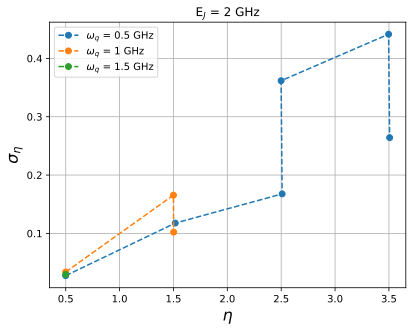

In [14]:
qfreqs=[0.5,1,1.5]
for q in qfreqs:
    anharm_plot = []
    anharm_std_plot = []
    for i in range(len(df)):
        if round(df.iloc[i]["qfreq"],1) == q:
            anharm_plot.append(df.iloc[i]["anharm"])
            anharm_std_plot.append(df.iloc[i]["anharm std"])
    plt.plot(anharm_plot,anharm_std_plot,"o--",label = rf"$\omega_q$ = {q} GHz")
plt.ylabel(r"$\sigma_{\eta}$",fontsize = 16)
plt.xlabel(r"$\eta$", fontsize = 16)
plt.legend()
plt.grid()
plt.title(rf"E$_J$ = {fluxonium.EJ} GHz")


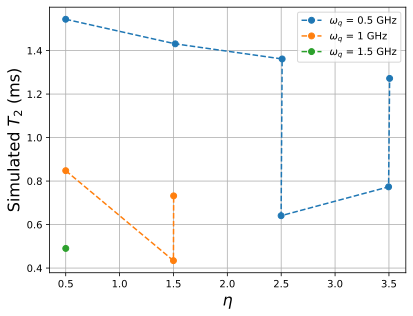

In [15]:
qfreqs=[0.5,1,1.5]
for q in qfreqs:
    anharm_plot = []
    t2_plot = []
    for i in range(len(df)):
        if round(df.iloc[i]["qfreq"],1) == q:
            anharm_plot.append(df.iloc[i]["anharm"])
            t2_plot.append(df.iloc[i]["t2_eff"]/1e6)
    plt.plot(anharm_plot,t2_plot,"o--",label = rf"$\omega_q$ = {q} GHz")
plt.ylabel(r"Simulated $T_2$ (ms)",fontsize = 16)
plt.xlabel(r"$\eta$", fontsize = 16)
plt.legend()
plt.grid()

In [17]:
def compare_potential_qubits(fluxonium, shade_qfreq = False):
    if fluxonium.potential_qubits is None:
        raise AttributeError("The potential_qubits attribute is not set or initialized.")
    if fluxonium.potential_qubits["qubit_0"]["t1_eff"] == None:
        raise AttributeError("Make sure there are potential qubits and their properties have been estimated")
    # Create figure and axis

    t1 = []
    t2 = []
    n_s = []
    xtix = []
    qfreqs = []
    for i in range(len(fluxonium.potential_qubits)):
        t1.append(fluxonium.potential_qubits[f"qubit_{i}"]["t1_eff"]/1e6)
        t2.append(fluxonium.potential_qubits[f"qubit_{i}"]["t2_eff"]/1e6)
        n_s.append(1/fluxonium.potential_qubits[f"qubit_{i}"]["anharm std"])
        qfreqs.append(fluxonium.potential_qubits[f"qubit_{i}"]["qfreq"])
        xtix.append(f"q{i}")

    # Create figure and axis
    fig, ax1 = plt.subplots()

    # Plot the first two datasets (T1 and T2)
    ax1.plot(xtix,t1, "o--", label=r"$T_1$", color="blue")
    ax1.plot(xtix,t2, "o--", label=r"$T_2$", color="orange")
    ax1.set_ylabel("Coherence Times (ms)")
    ax1.tick_params(axis='y')

    # Create a second y-axis
    ax2 = ax1.twinx()
    ax2.plot(xtix,n_s, ".-", label=r"$\sigma_\eta^{-1}$", color="green")
    ax2.set_ylabel(r"Anharmonicity $\sigma^{-1}$")
    ax2.tick_params(axis='y')

    # Add legends for both axes
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc="upper right")


    cmap = plt.get_cmap("tab20")
    freq_colours = {freq:cmap(i) for i, freq in enumerate(fluxonium.qfreqs)}
    # Track which frequencies have been labeled
    labeled_freqs = set()
    # Shade regions based on qubit frequency if shade_qfreq is True
    if shade_qfreq and fluxonium.qfreqs is not None:
        cmap = plt.get_cmap("tab20")
        freq_colours = {freq:cmap(i) for i, freq in enumerate(fluxonium.qfreqs)}
        # Track which frequencies have been labeled
        labeled_freqs = set()
        for q in fluxonium.qfreqs:
            for i, qf_value in enumerate(qfreqs):  # Use 'qf_value' to avoid overwriting 'qf' list
                if 1.05*q > qf_value > q * 0.95:  # Adjust condition as needed
                    ax1.fill_between(
                        [i - 0.5, i + 0.5],
                        min(min(t1), min(t2)),
                        max(max(t1), max(t2)),
                        color = freq_colours.get(q, "gray"),
                        alpha=0.2,
                    )
                    # Add text label only once per unique frequency
                    if q not in labeled_freqs:
                        ax1.text(i+0.5, 0.35*(max(t1) - min(t1)) + 0.2, rf"$\omega_q \approx {q}$ GHz", ha="center", va="bottom")
                        labeled_freqs.add(q)  # Mark this frequency as labeled


    # Add a title for clarity
    plt.title(r"Qubits for $E_J$ = " + str(fluxonium.EJ) + " GHz")

    # Show the plot
    plt.tight_layout()  # Adjust layout to avoid overlapping labels
    return fig

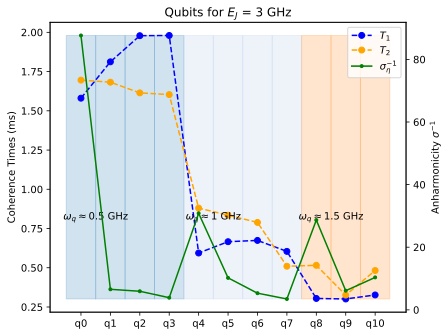

In [52]:
plot3 = compare_potential_qubits(fluxonium,True)

In [19]:
fluxonium.param_sweep(n_steps = 300,multicore = 5,freq_tol = 0.01,anharm_tol = 0.01)

Multicore sweep: 100%|██████████| 90000/90000 [01:50<00:00, 813.45it/s] 


 c:\Users\lguerrero\OneDrive - University College London\PhD\sfq_sim\sfq_sim\fluxonium_finder.py: 85

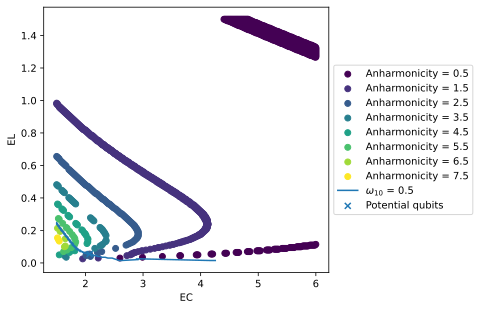

In [20]:
plot4 = fluxonium.plot_sweep()

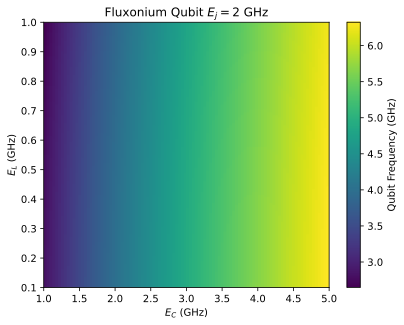

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Example: generating dummy data (replace this with your actual data)
Ec = np.linspace(1, 5, 100)  # EC values
EL = np.linspace(0.1, 1, 100)  # EL values
Ec, EL = np.meshgrid(Ec, EL)
Ej = 2  # Josephson energy in GHz
f = np.sqrt((4 * Ej * Ec - EL**2))  # Dummy function for qubit frequency, adjust to your formula

# Using imshow to create a smooth color plot without lines
plt.imshow(f, extent=[Ec.min(), Ec.max(), EL.min(), EL.max()], origin='lower', 
           aspect='auto', cmap='viridis')

plt.colorbar(label='Qubit Frequency (GHz)')
plt.contour(Ec, EL, f, levels=[0.5, 1.0, 1.5], colors='black', linewidths=2)  # Optional contour lines for specific frequencies

# Adding labels and titles
plt.title('Fluxonium Qubit $E_j = 2$ GHz')
plt.xlabel('$E_C$ (GHz)')
plt.ylabel('$E_L$ (GHz)')

plt.show()
